# AI 4 Materials Industry
# Case study 2: Faulty steel plates
# Notebook 1: Deep learning for image classification


In the previous notebook we learned how we can use machine learning to detect faults on steel plates. To achieve this we used a dataset which had preprocessed features obtained from the images and process. Using exploratory data analysis and explainable AI we learned just which features helped our classification most. The reality however is that creating these features in the first place is a time-consuming process, requiring careful thought. When we as humans look at images we are able to interpret the defects in an image much quicker. In this notebook we'll attempt to mimic this using deep learning, which will automatically create features for us directly from an image. The resulting feature vector will be solely determined by the architecture of the model. We will be using the FastAI library for this lesson, which allows us to quickly train deep learning classification models with PyTorch.

## Exploratory data analysis

Since the model will determine the features for us, exploratory data analysis for an image dataset mainly focuses on checking the type and quality of the images. Have a look at the files through the file manager or download the dataset to your computer to have a look. You can download it from the [the dataset's website](http://faculty.neu.edu.cn/songkc/en/zhym/263264/list/index.htm).

### Exercise 1
Try to answer the following questions:
* How many types of defects are there and what's their name?
* How many images are there per defect?
* How consistent are the images within a category and overall? (brightness/contrast/blurriness/...)
* Are there anomalies in the dataset? (drops/dust balls/fingers over the lense/...)

What might be the consequences of low data quality? How would you create a training/validation/test split for this dataset?

### Solution
* There are six defect types: Rolled-in scale, patches, crazing, pitted surface, inclusion, scratches.
* There are 300 images per class, 10 have been extracted as a test set.
* Lighting conditions can differ, if extremes are rarer or obscure detail this could affect performance.
* The same area is photographed multiple times, which may contaminate our validation set! 

## Setting up the environment

As before we first need to import some libraries.

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline
from fastai.vision.all import * # Deep learning for computer vision
import numpy as np # Math functions
import pandas as pd # Pandas is used for handling databases, and will be used for reading and manipulating the data
import matplotlib.pyplot as plt # Plot functions
import seaborn as sns # More plot functions
print(torch.__file__,
      torch.__version__)
from pathlib import Path
sns.set_palette('colorblind') # Making the plots colorblind-friendly
sns.set_style('darkgrid') # More info at https://seaborn.pydata.org/tutorial/aesthetics.html

//dodrio/scratch/projects/explor_2022_008/miniconda/envs/ai4mi/lib/python3.9/site-packages/torch/__init__.py 1.11.0


## Checking for  GPU
While this problem is still relatively small, it is more efficient to work on GPU for images. Let's see if our gpu is detected.

In [2]:
print('Do we have any CUDA GPU available?', torch.cuda.is_available()) # (NVIDIA GPUs)
print('Which GPU are we using?', torch.cuda.current_device()) #  (0,1,2,3)


Do we have any CUDA GPU available? True
Which GPU are we using? 0


The command-line argument nvidia-smi gives even more information on the GPUs available, including their current load and memory usage.

In [3]:
! nvidia-smi

Sun Jun 26 10:24:44 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 510.47.03    Driver Version: 510.47.03    CUDA Version: 11.6     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA A100-SXM...  On   | 00000000:03:00.0 Off |                    0 |
| N/A   34C    P0    55W / 400W |      3MiB / 40960MiB |      0%      Default |
|                               |                      |             Disabled |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

If we want to switch the device later we can use the following code:

### Exercise 2: 
Verify you are using a  and answer the following questions:
1. Which GPU id are you using?
2. What is the name of this GPU? 
3. Are you using a CUDA GPU and if yes, what version of CUDA is installed?
4. What version of the NVIDIA drivers are you using?
5. How much GPU memory does it have?
6. How much memory is currently being used?
7. What percentage of the GPU is currently being used?
8. What is its maximum power usage? 
9. What is its current usage?
10. What is its current temperature?

### Solution
![nvidia-smi](nvidia-smi.png)


## Loading the data

Now we understand the dataset's structure and have our environment setup, the next step is to make the dataset available for our deep learning models. Since images are very large we will not be able to train on our entire dataset at once. To remedy this we split the loading of our images in two steps. 

First we define the dataset:

In [4]:
# look in the current directory
path = Path('./')
# List the files and folders in the current folder
print(path.ls())
# Store a list of all image files in the dataset folder
files = get_image_files(path / 'NEU-CLS') # we get a list of all the files in the folder

[Path('test'), Path('__pycache__'), Path('vsc-ai4mi-case2_solutions.ipynb'), Path('vsc-ai4mi-case2.ipynb'), Path('NEU-CLS'), Path('vsc-ai4mi-case2.pdf'), Path('nvidia-smi.png'), Path('.ipynb_checkpoints'), Path('models'), Path('vsc-ai4mi-case2.pptx'), Path('NEU-CLS-dataset.zip'), Path('functions.py')]


In [5]:
files

(#1740) [Path('NEU-CLS/PS_199.bmp'),Path('NEU-CLS/Cr_165.bmp'),Path('NEU-CLS/PS_181.bmp'),Path('NEU-CLS/Pa_222.bmp'),Path('NEU-CLS/In_187.bmp'),Path('NEU-CLS/PS_104.bmp'),Path('NEU-CLS/Sc_182.bmp'),Path('NEU-CLS/RS_262.bmp'),Path('NEU-CLS/In_268.bmp'),Path('NEU-CLS/In_206.bmp')...]

Let's have a look at what input arguments are needed to make an image dataloader from these files.

In [6]:
?ImageDataLoaders.from_name_func

Signature:
ImageDataLoaders.from_name_func(
    path,
    fnames,
    label_func,
    valid_pct=0.2,
    seed=None,
    item_tfms=None,
    batch_tfms=None,
    bs=64,
    val_bs=None,
    shuffle=True,
    device=None,
)
Docstring: Create from the name attrs of `fnames` in `path`s with `label_func`
File:      //dodrio/scratch/projects/explor_2022_008/miniconda/envs/ai4mi/lib/python3.9/site-packages/fastai/vision/data.py
Type:      method


We see that by default the validation set is 20% of the total dataset. We have already extracted a test set for you. Note that the datasets are shuffled before performing the split. Unlike in an excel file it's not as easy to store the labels inside an image. Luckily, in this case, we can just extract the label from the filename.

In [7]:
def get_label(file): return str(file).split('/')[-1].split('_')[0] # we define a function to get the label from the filename
dls = ImageDataLoaders.from_name_func(path, files, get_label, bs=64, batch_tfms=[Normalize.from_stats(*imagenet_stats)]) # cpu for cpu

The default random split sizes are as follows:

In [8]:
len(files),len(dls.train_ds),len(dls.valid_ds)

(1740, 1392, 348)

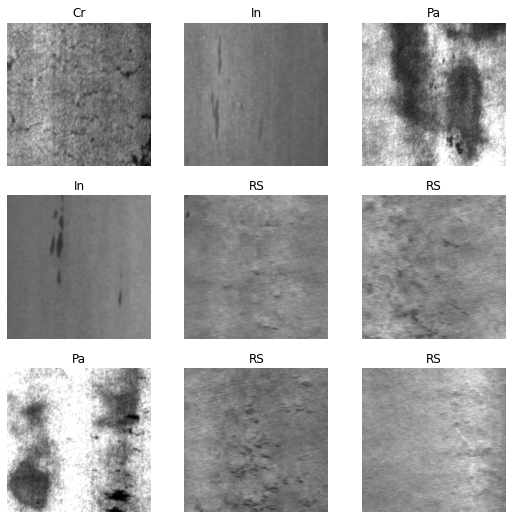

In [9]:
dls.show_batch()


### Exercise 3:

Answer the following questions:
* Should or shouldn't you shuffle your data?
* What do you think about the size of the total dataset, and the size of the split?

### Solution
* Shuffling is usually a good idea, though here it's quite dangerous with the overlapping images... We will continue and see what happens. If needed you can tell the dataloader which images to put in validation and test based on an extra excel column or the row number, in practice this set should probably be enlarged and cleaned up.
* We don't have much data, making the validation split a bit small, but we do need enough data to train on. Augmentation can help.

## Training a model
We will now train a model. To do this we need to choose a **model architecture**, for which we will use an 18 block residual net by default (resnet18). Since we have very little data we definitely need **transfer learning**. To use model parameters trained on Imagenet we use the flag pretrained=True. Our own dataset we already prepared, so now all we need is to optimize it for a certain error or **loss function**. The standard **optimizer** is called Adam and works fairly well. The standard loss function is the [cross entropy](https://pytorch.org/docs/stable/generated/torch.nn.CrossEntropyLoss.html). All these configurations are stored in a **Learner object**, which combines data, model and training settings.

In [10]:
learn = vision_learner(dls, resnet18, pretrained=True)


While deep learning does not have too many essential hyperparameters, we must determine the step size or learning rate of our gradient descent optimizer. Rather than choosing random values and seeing how this affects our entire training procedure, we will determine our maximum learning rate with a learning rate finder. The learning rate finder will perform an optimization step for a series of batches and see which learning rate causes the largest decrease in loss function. 

0.0006918309954926372


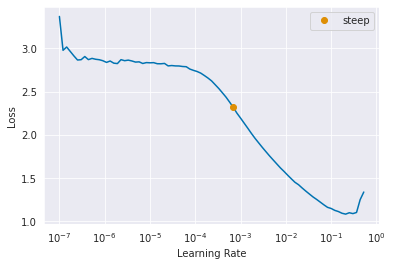

In [11]:
learn.dls.train.bs = 64
lr = learn.lr_find(suggest_funcs=(steep))
print(lr.steep)

We see the typical behavior of a learning rate finder. We will choose the learning rate at the point of steepest descent.

### Exercise 4:
Try the learning rate finder with different batch sizes. 
* What is the effect of a very small batch size on the learning rate?
* What is the effect of a very large batch size?
* What learning rate do you choose in both cases?

Next we will train our model using our selected learning rate. We will use the finetune function since we are performing transfer learning. We will keep our pretrained features frozen for 1 epoch, an epoch being one pass through our dataset. During this time we only update the final output layers of our model, based on imagenet features. Afterwards we train all parameters for another ten epochs, with a learning rate that is automatically halved.

### Solution
* First let's try batch size 2. We see that during one epoch we now get many more updates of our model parameters, but we also see that the learning rate graph becomes extremely noisy. For each batch it is trying to make updates for maximum two classes which can worsen the performance of the other classes. During each step less data is shown so more steps are needed to learn the same information. The suggested learning rate is not reliable as it is trying to find the maximal slope on a very noisy curve.

1.9054607491852948e-06


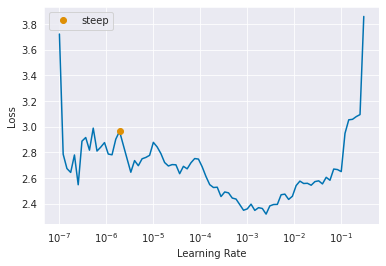

In [13]:
learn.dls.train.bs = 2
# if this fails, just try it again
lr2 = learn.lr_find(suggest_funcs=(steep))
print(lr2.steep)

* Now let's try a larger batch size, 512. Each step more information is passed through the model and due to the large batch size each batch is highly representative for the dataset. This leads to a very smooth learning rate curve, but it also takes much longer to perform enough steps to build the learning rate curve.

0.0003981071640737355


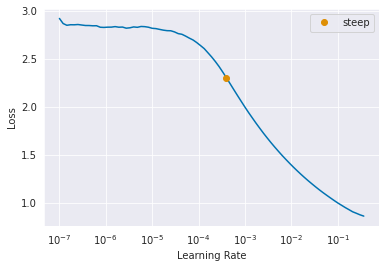

In [14]:
learn.dls.train.bs = 512
lr512 = learn.lr_find(suggest_funcs=(steep))
print(lr512.steep)

* Choosing the optimal learning rate is not an exact science. For batch size 64 the suggested learning rate of 0.001 looks good, but you could try going as high as 0.01 if you keep a look out for unstable training. For batch size 512 the suggested learning rate is slightly lower, but the curve looks much the same. The slope may be slightly better, but it is not said this is truly significant. In fact to the right the curve seems to keep going down longer, so maybe a higher learning rate is also worth trying. You should just stay sufficiently before the bottom of the learning rate curve. For batch size 2 the graph is far too noisy to deduce much. The automatic suggestion has failed, the steepest area is around 1e-7 but you can assume that learning rates that low will simply lead to no updates. Probably it'll also learn around 0.001 which for these types of models is fairly standard.

### Finetuning the model
We will now use the defined learning rate to finetune our first model. 

In [15]:
?learn.fine_tune

Signature:
learn.fine_tune(
    epochs,
    base_lr=0.002,
    freeze_epochs=1,
    lr_mult=100,
    pct_start=0.3,
    div=5.0,
    lr_max=None,
    div_final=100000.0,
    wd=None,
    moms=None,
    cbs=None,
    reset_opt=False,
)
Docstring: Fine tune with `Learner.freeze` for `freeze_epochs`, then with `Learner.unfreeze` for `epochs`, using discriminative LR.
File:      //dodrio/scratch/projects/explor_2022_008/miniconda/envs/ai4mi/lib/python3.9/site-packages/fastai/callback/schedule.py
Type:      method


In [16]:
learn.dls.train.bs=64
learn.fine_tune(10, base_lr=lr.steep, freeze_epochs=1)

epoch,train_loss,valid_loss,time
0,1.604524,0.832696,00:25


epoch,train_loss,valid_loss,time
0,0.230569,0.326411,00:20
1,0.149384,0.055144,00:05
2,0.097688,0.036967,00:04
3,0.064360,0.017966,00:04
4,0.047937,0.011623,00:04
5,0.034245,0.012299,00:04
6,0.023005,0.021921,00:04
7,0.016225,0.020843,00:04
8,0.012171,0.020603,00:04
9,0.008930,0.020317,00:04


The learning rate is actually varied according to a schedule using this function. The optimal schedule depends on your optimizer. Let's have a look at what it looked like.

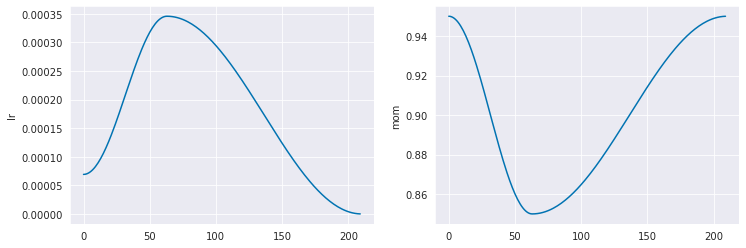

In [17]:
learn.recorder.plot_sched()

This graph only shows the evolution during the unfrozen cycle. It gradually warms up the learning rate, and then it starts to decay. This allows the suboptimal initial weights to gradually adapt before making any drastic changes, similar to simulated annealing. Let's finally have a look at our loss.

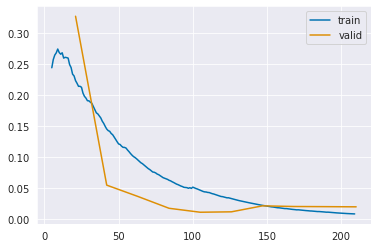

In [18]:
learn.recorder.plot_loss()

We see our training loss dropped gradually, with the largest decay when we had the largest step size. The validation less saturated much quicker. We should be careful with overfitting, though the loss did not go up at the end. This means we are probably fine, but could add regularization. We definitely don't need to train longer.

Let's save the model for later.

In [19]:
learn.save('resnet18_pretrained_bs64')

Path('models/resnet18_pretrained_bs64.pth')

### Exercise 5
* Try comparing a pretrained vs a randomly initialized model. How does it perform? Since there is nothing to finetune you can use learn.fit_one_cycle instead.
* You can also try varying the ratio of frozen to normal epochs. Can you reach the same loss even faster?

### Solution
* We start with training a non-pretrained model. If we look at the loss curves we see it definitely has major generalization issues at first, but seems to synchronize better towards the end. The pretrained model had a better loss already after four epochs though so we'd have to train this one much longer and it may risk not generalizing as well. The loss is better synchronized towards the end though.

In [22]:
?learn.fit_one_cycle

Signature:
learn.fit_one_cycle(
    n_epoch,
    lr_max=None,
    div=25.0,
    div_final=100000.0,
    pct_start=0.25,
    wd=None,
    moms=None,
    cbs=None,
    reset_opt=False,
)
Docstring: Fit `self.model` for `n_epoch` using the 1cycle policy.
File:      //dodrio/scratch/projects/explor_2022_008/miniconda/envs/ai4mi/lib/python3.9/site-packages/fastai/callback/schedule.py
Type:      method


epoch,train_loss,valid_loss,time
0,2.282129,2.210566,00:07
1,1.691372,1.203067,00:05
2,1.262980,0.395385,00:05
3,0.985911,0.265297,00:04
4,0.771776,0.251735,00:04
5,0.638314,0.201017,00:04
6,0.541443,0.204755,00:04
7,0.461355,0.178929,00:04
8,0.423220,0.197532,00:04
9,0.375122,0.190012,00:04


Path('models/resnet18_random_bs64.pth')

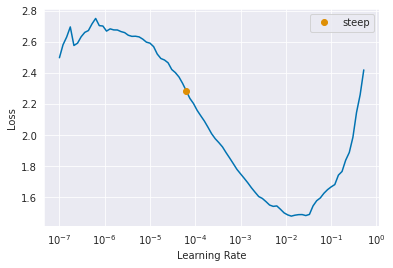

In [23]:
learn = vision_learner(dls, resnet18, pretrained=False)
learn.dls.train.bs=64
lr = learn.lr_find(suggest_funcs=(steep))
learn.fit_one_cycle(11, lr_max=lr.steep)
learn.save('resnet18_random_bs64')

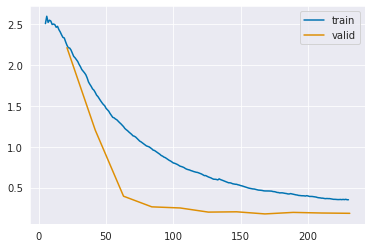

In [24]:
learn.recorder.plot_loss()

### Adding some augmentation

epoch,train_loss,valid_loss,time
0,1.854531,1.262079,00:07


epoch,train_loss,valid_loss,time
0,0.332876,0.756262,00:05
1,0.260936,0.143950,00:05
2,0.197215,0.022656,00:05
3,0.143689,0.010778,00:05
4,0.107349,0.019154,00:05
5,0.084270,0.012646,00:05
6,0.068105,0.007836,00:05
7,0.053360,0.010799,00:05
8,0.042234,0.009568,00:05
9,0.040863,0.010481,00:05


Path('models/resnet18_pretrained_bs64_aug.pth')

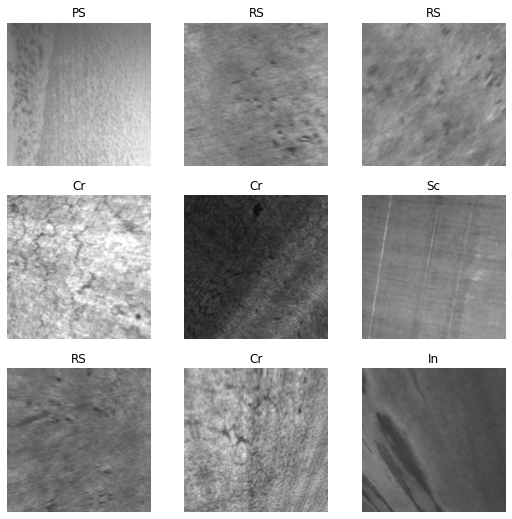

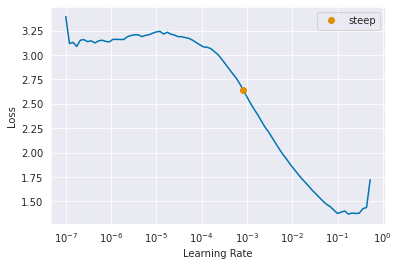

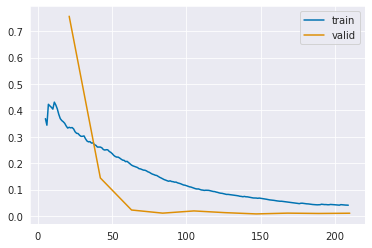

In [26]:
dls = ImageDataLoaders.from_name_func(path, files, get_label, bs=64, batch_tfms=[*aug_transforms(mult=1.0,
                do_flip=True,
                flip_vert=True,
                max_rotate=45.0,
                min_zoom=0.8,
                max_zoom=1.2,
                max_lighting=0.1,
                max_warp=0.3,
                p_affine=0.75,
                p_lighting=0.75,
                xtra_tfms=None,
                size=None,
                mode='bilinear',
                pad_mode='reflection',
                align_corners=True,
                batch=False,
                min_scale=1.0),Normalize.from_stats(*imagenet_stats)]) 
dls.show_batch()
learn = vision_learner(dls, resnet18, pretrained=True)
learn.dls.train.bs=64
lr = learn.lr_find(suggest_funcs=(steep))
learn.fine_tune(10, base_lr=lr.steep, freeze_epochs=1)
plt.subplots(1,1)
learn.recorder.plot_loss()
learn.save('resnet18_pretrained_bs64_aug')


### Exercise 6
* Try changing the augmentation, check your augmentation by visualizing an example batch.
Have a look at example photos in the [FastAI docs](https://docs.fast.ai/vision.augment.html).
* Is it worth it?
* How does augmentation affect the compute time?

## Solution
* Since we're working from a top view, we are quite free in performing large rotations, but should make sure certain defects do not require orientation. Here it is likely not the case, but one could for instance have two types of scratches which are oriented differently with respect to the rolling direction. With augmentation such as lighting we have to be careful that the image is still readable, else the model will try to map a black or white image to a specific class. If this is once in a while it may be able to recover, if it is every batch then issues will occur...
* The more aggressive the augmentation, the higher the loss. The discrepancy between train and validation set actually goes up because the validation data loader by default does not apply augmentation. We will later look at some augmented test images.
* Augmentation does not seem to affect the speed much if at all on this machine. One has to be careful though since some libraries will perform augmentation on the CPU per photograph, which can become a speed bottleneck.


epoch,train_loss,valid_loss,time
0,1.483184,1.113910,00:07


epoch,train_loss,valid_loss,time
0,0.512442,0.512735,00:05
1,0.405519,0.152600,00:05
2,0.352503,0.019806,00:04
3,0.304511,0.023945,00:05
4,0.258582,0.009920,00:04
5,0.202192,0.009780,00:04
6,0.178173,0.009329,00:04
7,0.156570,0.015799,00:04
8,0.143790,0.014329,00:04
9,0.129132,0.012917,00:04


Path('models/resnet18_pretrained_bs64_aug_aggressive.pth')

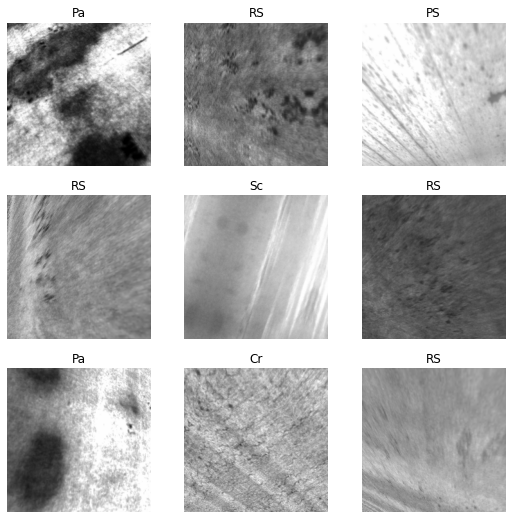

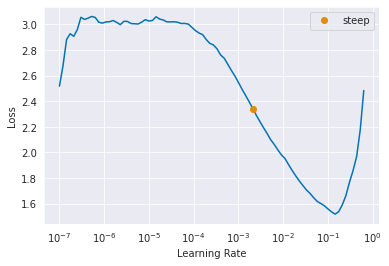

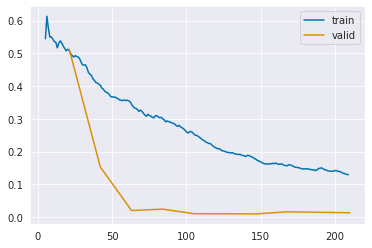

In [27]:
dls = ImageDataLoaders.from_name_func(path, files, get_label, bs=64, batch_tfms=[*aug_transforms(mult=1.0,
                do_flip=True,
                flip_vert=True,
                max_rotate=180.0,
                min_zoom=0.5,
                max_zoom=1.5,
                max_lighting=0.5,
                max_warp=0.5,
                p_affine=0.9,
                p_lighting=0.8,
                xtra_tfms=None,
                size=224,
                mode='bilinear',
                pad_mode='reflection',
                align_corners=True,
                batch=False,
                min_scale=1.0),Normalize.from_stats(*imagenet_stats)]) 
dls.show_batch()
learn = vision_learner(dls, resnet18, pretrained=True)
learn.dls.train.bs=64
lr = learn.lr_find(suggest_funcs=(steep))
learn.fine_tune(10, base_lr=lr.steep, freeze_epochs=1)
plt.subplots(1,1)
learn.recorder.plot_loss()
learn.save('resnet18_pretrained_bs64_aug_aggressive')


### Exercise 7

* Try changing the model size using a pretrained model (or optionally also a random model), how does the model size affect the loss? The following models are available: resnet34, resnet50, resnet101, resnet152.
* How does the model size affect the compute time?
* How does it affect the GPU memory and load? (try using nvidia-smi -l in a terminal window and drag it next to this tab). What happens if you up the batch size?


### Solution

We see the models all train well, though larger models don't necessarily have a smaller final loss... If you don't use pretrained models this effect is much more noticeable still. These models have more parameters so actually should be trained longer! Feel free to experiment. The larger models are definitely slower and use more memory, but the difference is not that large because we are using a very beefy GPU. The largest model takes about twice as long and uses twice the memory. Memory usage is of course also proportional to the batch size.

Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /dodrio/scratch/users/vsc44184/.cache/torch/hub/checkpoints/resnet34-b627a593.pth


  0%|          | 0.00/83.3M [00:00<?, ?B/s]

epoch,train_loss,valid_loss,time
0,1.426703,0.313169,00:07


epoch,train_loss,valid_loss,time
0,0.204223,0.150624,00:06
1,0.129632,0.065916,00:05
2,0.092789,0.039244,00:05
3,0.070649,0.027855,00:05
4,0.053252,0.008490,00:05
5,0.042060,0.014239,00:05
6,0.036501,0.004651,00:04
7,0.033495,0.006375,00:05
8,0.026229,0.005545,00:05
9,0.021172,0.004225,00:05


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /dodrio/scratch/users/vsc44184/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

epoch,train_loss,valid_loss,time
0,1.429655,0.547884,00:07


epoch,train_loss,valid_loss,time
0,0.265049,0.185378,00:07
1,0.210377,0.056200,00:05
2,0.153645,0.057396,00:05
3,0.115454,0.028354,00:05
4,0.089654,0.032998,00:05
5,0.074323,0.023659,00:05
6,0.059165,0.015763,00:05
7,0.048752,0.016146,00:05
8,0.044179,0.022686,00:05
9,0.039035,0.020757,00:05


Downloading: "https://download.pytorch.org/models/resnet101-63fe2227.pth" to /dodrio/scratch/users/vsc44184/.cache/torch/hub/checkpoints/resnet101-63fe2227.pth


  0%|          | 0.00/171M [00:00<?, ?B/s]

epoch,train_loss,valid_loss,time
0,1.499873,1.247768,00:08


epoch,train_loss,valid_loss,time
0,0.269187,0.656486,00:09
1,0.214414,0.087358,00:10
2,0.157775,0.089839,00:08
3,0.112046,0.063826,00:07
4,0.085311,0.043843,00:07
5,0.064224,0.043674,00:07
6,0.051094,0.062409,00:07
7,0.046577,0.058470,00:07
8,0.040988,0.049480,00:07
9,0.035983,0.064295,00:07


Downloading: "https://download.pytorch.org/models/resnet152-394f9c45.pth" to /dodrio/scratch/users/vsc44184/.cache/torch/hub/checkpoints/resnet152-394f9c45.pth


  0%|          | 0.00/230M [00:00<?, ?B/s]

epoch,train_loss,valid_loss,time
0,1.338269,0.549588,00:11


epoch,train_loss,valid_loss,time
0,0.208137,0.357676,00:11
1,0.148436,0.090501,00:11
2,0.113521,0.108753,00:10
3,0.092796,0.049938,00:10
4,0.072684,0.021328,00:12
5,0.054940,0.026114,00:11
6,0.041102,0.025969,00:11
7,0.030332,0.020606,00:10
8,0.024513,0.014821,00:11
9,0.020608,0.016220,00:11


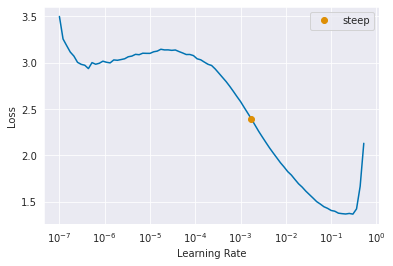

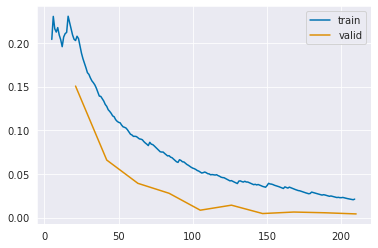

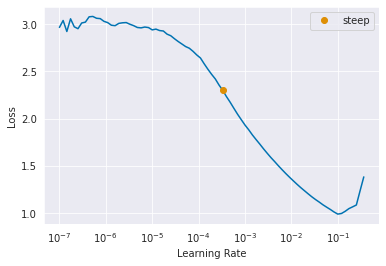

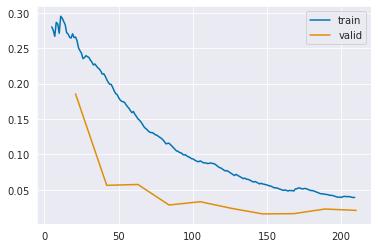

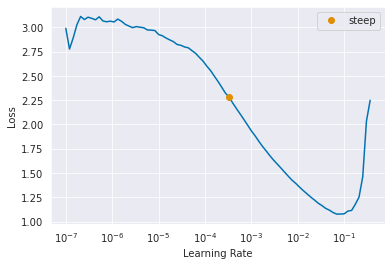

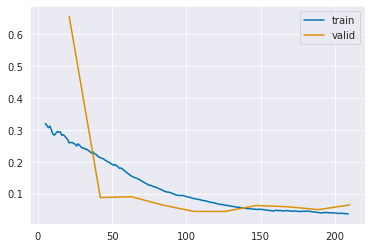

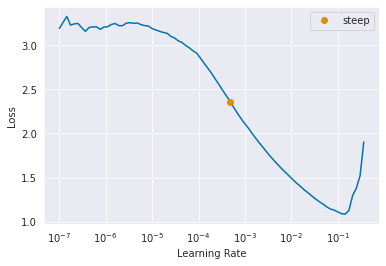

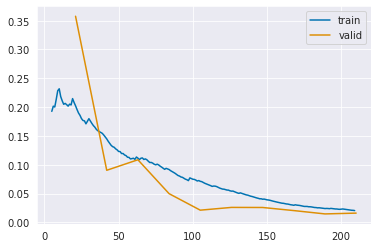

In [25]:
#Ideally you should tune the batch size again for each model
layers = [34,50,101,152]
models = [resnet34, resnet50, resnet101, resnet152]
for i in range(len(layers)):
    learn = vision_learner(dls, models[i], pretrained=True)
    learn.dls.train.bs=64
    lr = learn.lr_find(suggest_funcs=(steep))
    learn.fine_tune(10, base_lr=lr.steep, freeze_epochs=1)
    #making sure the plots dont overwrite eachother by making a new one
    plt.subplots(1,1,figsize=(6,4))
    learn.recorder.plot_loss()
    learn.save('resnet' + str(layers[i]) + '_pretrained_bs64')


In [30]:
?resnet18

Signature: resnet18(pretrained: bool = False, progress: bool = True, **kwargs: Any) -> torchvision.models.resnet.ResNet
Docstring:
ResNet-18 model from
`"Deep Residual Learning for Image Recognition" <https://arxiv.org/pdf/1512.03385.pdf>`_.

Args:
    pretrained (bool): If True, returns a model pre-trained on ImageNet
    progress (bool): If True, displays a progress bar of the download to stderr
File:      //dodrio/scratch/projects/explor_2022_008/miniconda/envs/ai4mi/lib/python3.9/site-packages/torchvision/models/resnet.py
Type:      function


### Exercise 8 
Compare cpu and gpu speed by moving your dataloader to the CPU after creating the learner. We recommend sticking to 1 epoch and not looking for the learning rate...
* Move to CPU: learn.dls.to('cpu')
* Move to GPU: learn.dls.to('cuda') or learn.dls.to('cuda:0') for a specific GPU


### Solution 
Switching to the CPU is not difficult at all! It is however at least five times slower, probably more if we continue.

epoch,train_loss,valid_loss,time
0,0.782691,0.761774,02:23


epoch,train_loss,valid_loss,time
0,0.875347,0.607472,00:22


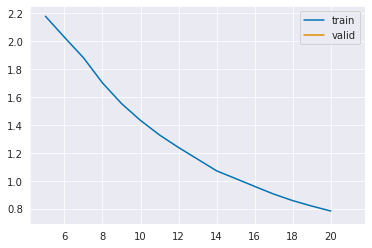

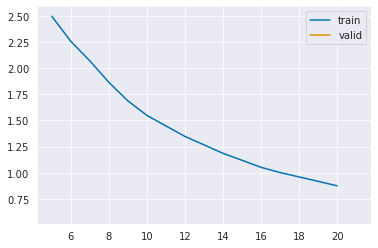

In [45]:
dls = ImageDataLoaders.from_name_func(path, files, get_label, bs=64) 

learn = vision_learner(dls, resnet18, pretrained=True)
learn.dls.to('cpu')
learn.dls.train.bs=64
learn.fit_one_cycle(1, lr_max=1e-3)
plt.subplots(1,1)
learn.recorder.plot_loss()


learn = vision_learner(dls, resnet18, pretrained=True)
learn.dls.to('cuda')
learn.dls.train.bs=64
learn.fit_one_cycle(1, lr_max=1e-3)
plt.subplots(1,1)
learn.recorder.plot_loss()

### Exercise 8 (optional)
Try different values of weight decay (example: 0, 0.001, 0.01, 0.1, 1) using the wd argument in fine_tune. 

### Solution
Not much difference is to be seen here.

epoch,train_loss,valid_loss,time
0,1.484029,0.828359,00:04


epoch,train_loss,valid_loss,time
0,0.552635,0.388543,00:05
1,0.459315,0.090439,00:04
2,0.425098,0.028231,00:03
3,0.337007,0.019513,00:03
4,0.271281,0.023249,00:03
5,0.238785,0.011689,00:03
6,0.203208,0.011118,00:03
7,0.182448,0.009001,00:03
8,0.163974,0.008804,00:03
9,0.153837,0.008919,00:03


epoch,train_loss,valid_loss,time
0,1.719460,0.687904,00:04


epoch,train_loss,valid_loss,time
0,0.622509,0.245450,00:03
1,0.543488,0.069589,00:03
2,0.435403,0.047128,00:04
3,0.361179,0.049032,00:03
4,0.308634,0.053840,00:03
5,0.273780,0.027020,00:03
6,0.240367,0.034938,00:03
7,0.211832,0.029071,00:03
8,0.196650,0.021400,00:03
9,0.179044,0.019757,00:03


epoch,train_loss,valid_loss,time
0,1.940711,0.669779,00:04


epoch,train_loss,valid_loss,time
0,0.721225,0.396702,00:03
1,0.619857,0.103192,00:03
2,0.523749,0.045148,00:13
3,0.427565,0.036397,00:05
4,0.368771,0.032843,00:04
5,0.318701,0.019780,00:03
6,0.275837,0.022082,00:03
7,0.236835,0.015303,00:03
8,0.210236,0.014301,00:03
9,0.199989,0.012860,00:03


epoch,train_loss,valid_loss,time
0,1.337542,0.742255,00:04


epoch,train_loss,valid_loss,time
0,0.486508,0.353860,00:03
1,0.369112,0.076031,00:03
2,0.316954,0.028862,00:03
3,0.276320,0.017771,00:03
4,0.236351,0.004830,00:03
5,0.189699,0.012055,00:03
6,0.178182,0.002605,00:03
7,0.157255,0.002233,00:03
8,0.140852,0.003576,00:03
9,0.127231,0.001992,00:03


epoch,train_loss,valid_loss,time
0,1.790609,0.677465,00:05


epoch,train_loss,valid_loss,time
0,0.607211,0.355371,00:09
1,0.498065,0.098474,00:06
2,0.426225,0.078098,00:03
3,0.363265,0.020411,00:03
4,0.305388,0.016563,00:03
5,0.261540,0.016065,00:03
6,0.215249,0.007135,00:03
7,0.180451,0.009424,00:03
8,0.172561,0.008202,00:03
9,0.156887,0.008073,00:03


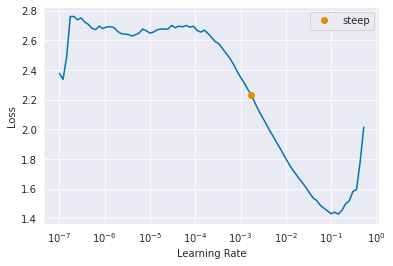

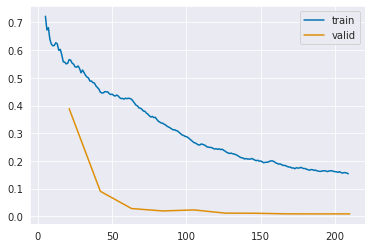

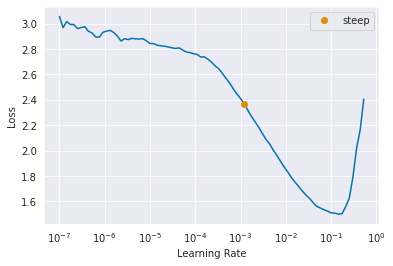

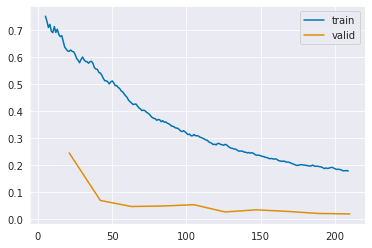

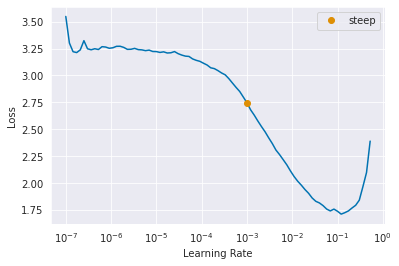

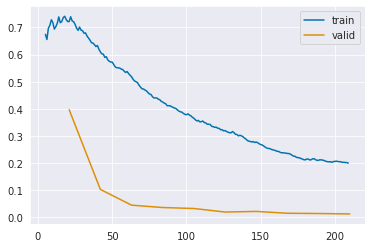

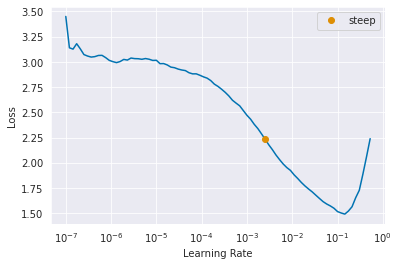

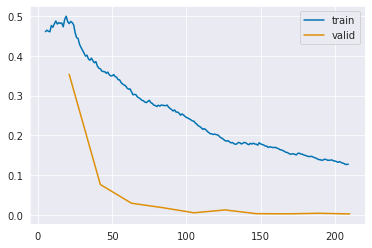

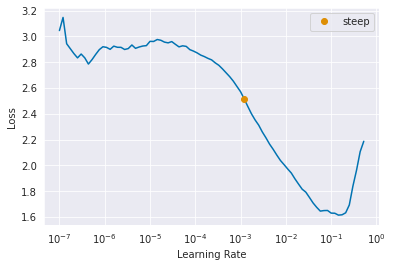

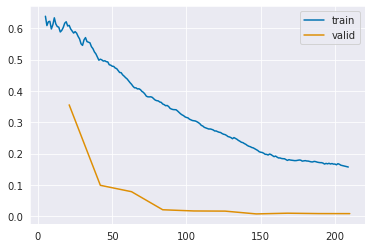

In [54]:
 for w in [0,0.001,0.01,0.1,1]:
    learn = vision_learner(dls, resnet18, pretrained=True)
    learn.dls.train.bs=64
    lr = learn.lr_find(suggest_funcs=(steep))
    learn.fine_tune(10, base_lr=lr.steep, freeze_epochs=1, wd=w)
    plt.subplots(1,1)
    learn.recorder.plot_loss()

### Exercise 9 (optional)
You can read in data in parallel with num_workers in the dataloader. Default it is set to 0, which does not use parallellization. Try varying it up to 12. Does it speed up? Does it up your memory usage?

### Solution

Does not seem to be faster, the overhead of parallellization setup is too inefficient in this case. It could still be that num_workers=6 for instance is more efficient.

epoch,train_loss,valid_loss,time
0,1.872843,1.009314,00:14


epoch,train_loss,valid_loss,time
0,0.610285,0.522436,00:17
1,0.497109,0.111343,00:16
2,0.389350,0.051970,00:17
3,0.335728,0.089268,00:17
4,0.308808,0.040086,00:18
5,0.250782,0.027754,00:16
6,0.201706,0.024565,00:16
7,0.181519,0.021352,00:17
8,0.168382,0.020871,00:16
9,0.158474,0.026715,00:15


Path('models/resnet18_pretrained_bs64_aug_aggressive.pth')

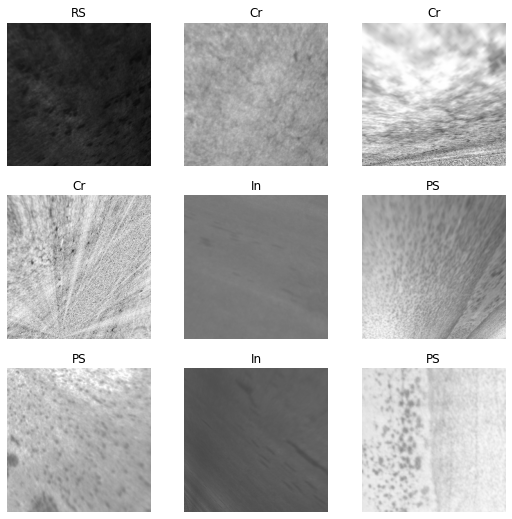

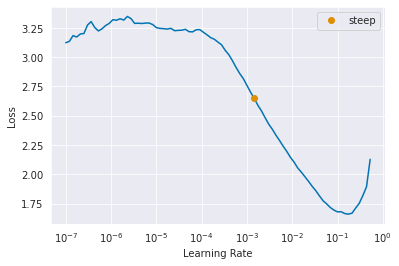

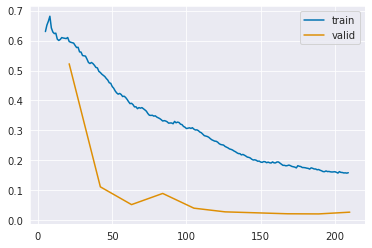

In [50]:
dls = ImageDataLoaders.from_name_func(path, files, get_label, bs=64, batch_tfms=[*aug_transforms(mult=1.0,
                do_flip=True,
                flip_vert=True,
                max_rotate=180.0,
                min_zoom=0.5,
                max_zoom=1.5,
                max_lighting=0.5,
                max_warp=0.5,
                p_affine=0.9,
                p_lighting=0.8,
                xtra_tfms=None,
                size=224,
                mode='bilinear',
                pad_mode='reflection',
                align_corners=True,
                batch=False,
                min_scale=1.0),Normalize.from_stats(*imagenet_stats)],num_workers=12) 
dls.show_batch()
learn = vision_learner(dls, resnet18, pretrained=True)
learn.dls.train.bs=64
lr = learn.lr_find(suggest_funcs=(steep))
learn.fine_tune(10, base_lr=lr.steep, freeze_epochs=1)
plt.subplots(1,1)
learn.recorder.plot_loss()


## Interpreting the results
Loss of course does not tell us everything so let's have a look at how we can interpret our results. Let's look at the classification of a random batch.

In [56]:
learn.load('resnet18_pretrained_bs64')

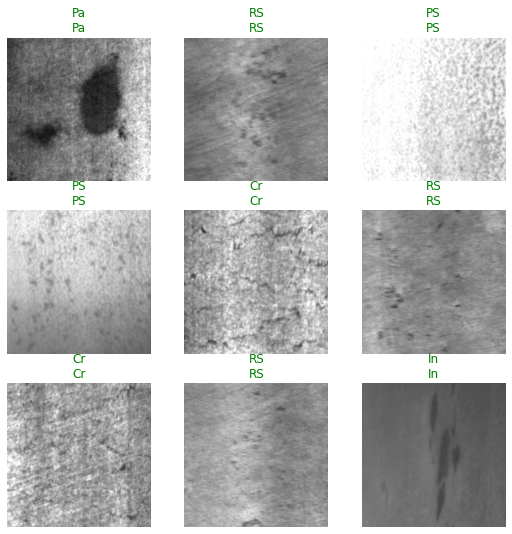

In [57]:
learn.show_results()


Matching labels are shown in green, wrong classifications are shown in red. To get a better idea of what is going wrong let's look at the worst performing images.

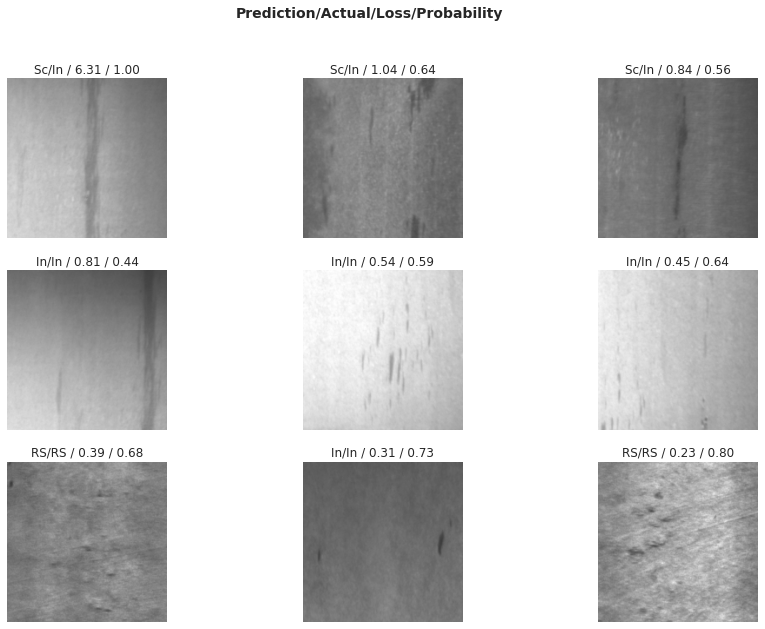

In [58]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_top_losses(9, figsize=(15,10))


At this time only two wrong images, the first has some clear contrast issues which the model mistakes for a patch, the escond has a bright reflection it thinks is a scratch. This makes perfect sense! The issue is more with the data quality. The others it doubts about but still classifies right. We see especially the pitted surface has some weird contours, while the scratch above is extremely dark. Let's look at the confusion matrix to get an idea of our global performance on the validation set.

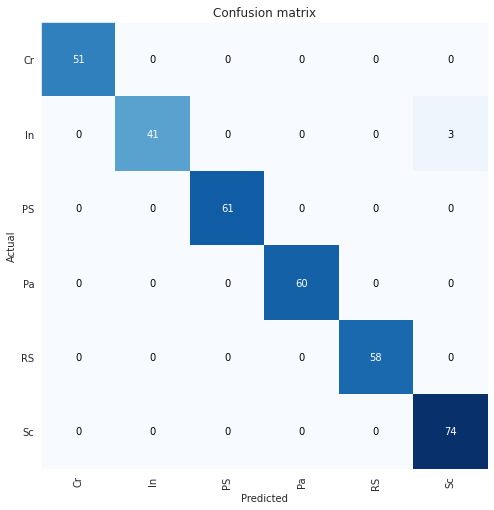

In [59]:
interp.plot_confusion_matrix(figsize=(7,7))


Well, that sure is good for a few minutes training. Since our dataset is so small, can we guarantee this will still work on new images though? Let's look at our test set and try altering the images slightly through augmentation.

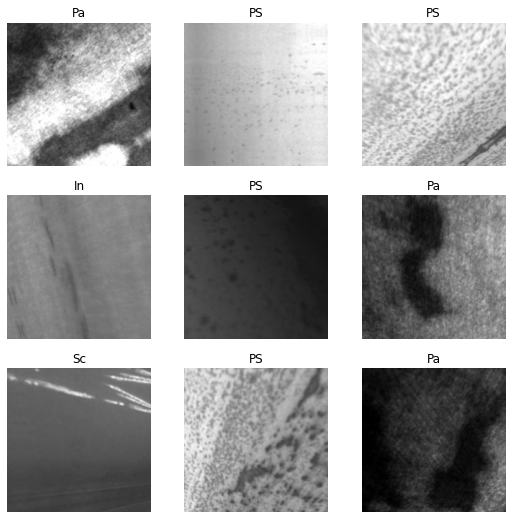

In [60]:
test_files = get_image_files(path / 'test') # we get a list of all the files in the folder

test_dls = ImageDataLoaders.from_name_func(path, test_files, get_label, bs=16, batch_tfms=[*aug_transforms(mult=1.0,
                do_flip=True,
                flip_vert=True,
                max_rotate=45.0,
                min_zoom=0.8,
                max_zoom=1.2,
                max_lighting=0.1,
                max_warp=0.3,
                p_affine=0.75,
                p_lighting=0.75,
                xtra_tfms=None,
                size=None,
                mode='bilinear',
                pad_mode='reflection',
                align_corners=True,
                batch=False,
                min_scale=1.0),Normalize.from_stats(*imagenet_stats)], shuffle=True)

test_dls.train.show_batch()
test_interp = ClassificationInterpretation.from_learner(learn, dl=test_dls.train)

We see the images are now rotated under altered lighting and show some distortion, a much better test.

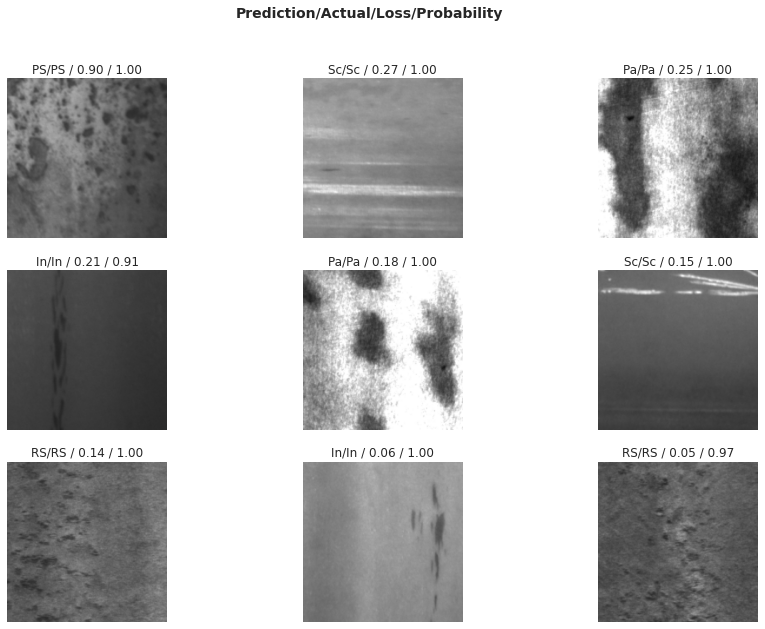

In [61]:
test_interp.plot_top_losses(9, figsize=(15,10))


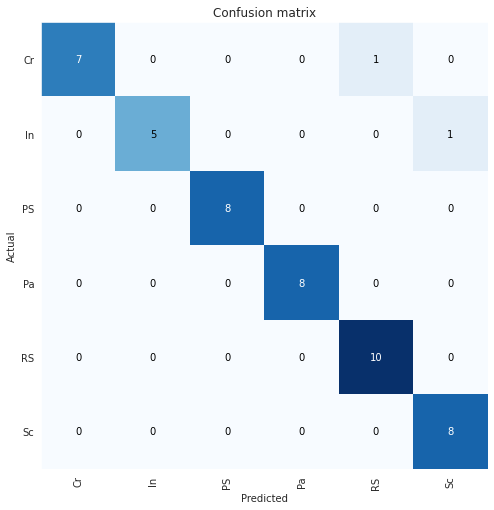

In [62]:
test_interp.plot_confusion_matrix(figsize=(7,7))


It actually performs quite well.

### Exercise 10
* How do your other models perform? Compare also with a bad one epoch model.

### Solution

epoch,train_loss,valid_loss,time
0,2.520571,1.965779,00:05


Path('models/resnet18_random_bs64_1epoch.pth')

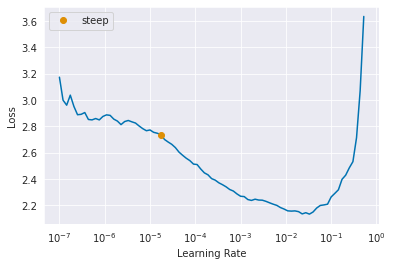

In [63]:
learn = vision_learner(dls, resnet18, pretrained=False)
learn.dls.train.bs=64
lr = learn.lr_find(suggest_funcs=(steep))
learn.fit_one_cycle(1, lr_max=lr.steep)
learn.save('resnet18_random_bs64_1epoch')

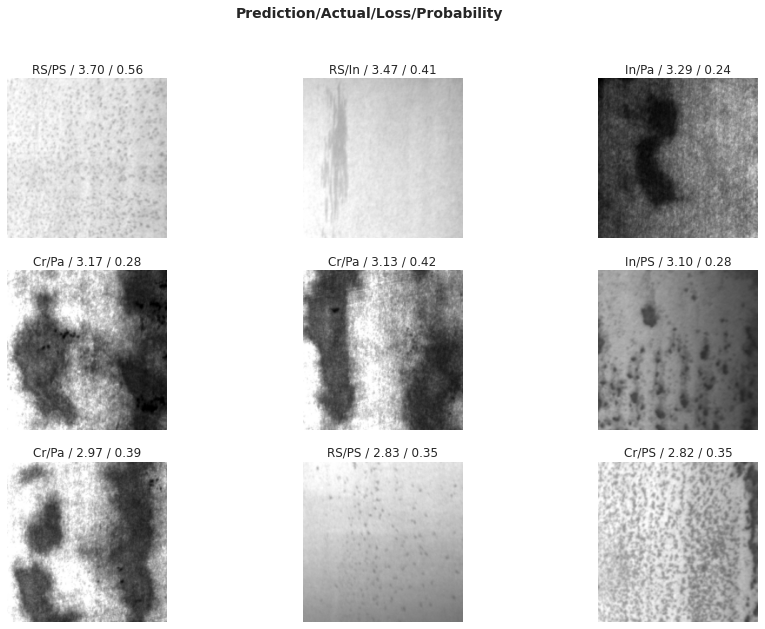

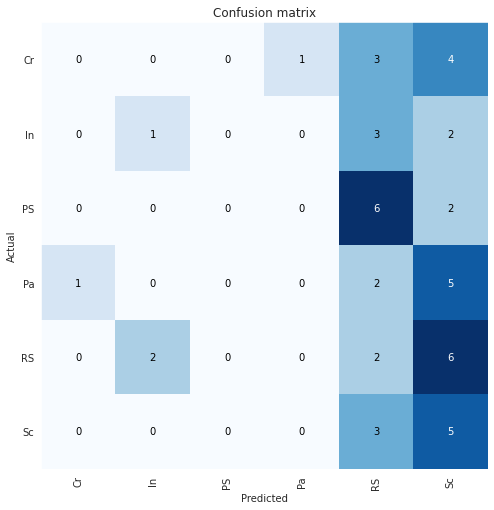

In [64]:
test_interp = ClassificationInterpretation.from_learner(learn, dl=test_dls.train)
test_interp.plot_top_losses(9, figsize=(15,10))
test_interp.plot_confusion_matrix(figsize=(7,7))


# SHAP
While we understand what goes right and wrong in our dataset, we don't yet understand *how* our AI makes its decisions. Luckily, the field of explainable AI has provided us several methods to help figure this out. We'll be using the SHAP method to determine the impact of each input feature, each pixel, of our image. Since this is an introductory session, we'll focus on demonstrating this rather than explaining all of the theory. Let's first install SHAP.

In [65]:
#! pip install shap

Next, we give the model a set of background images to learn to understand the dataset, then we determine the SHAP values for new images. This can take a few minutes...

In [66]:
learn.load('resnet18_pretrained_bs64')

In [67]:
from functions import image_shap

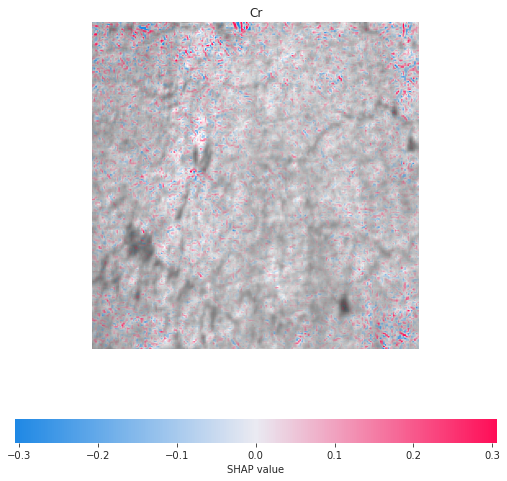

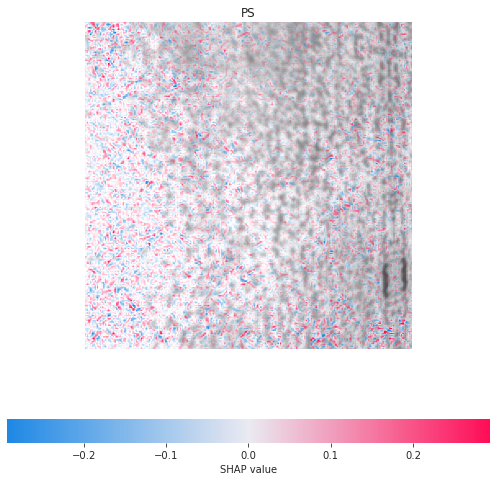

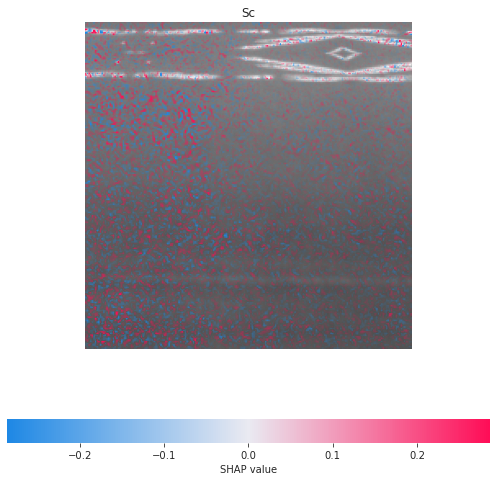

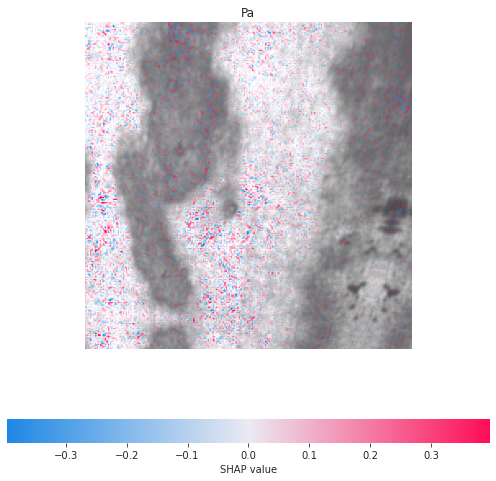

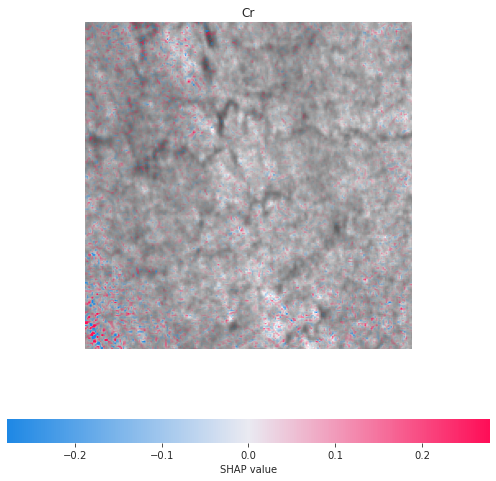

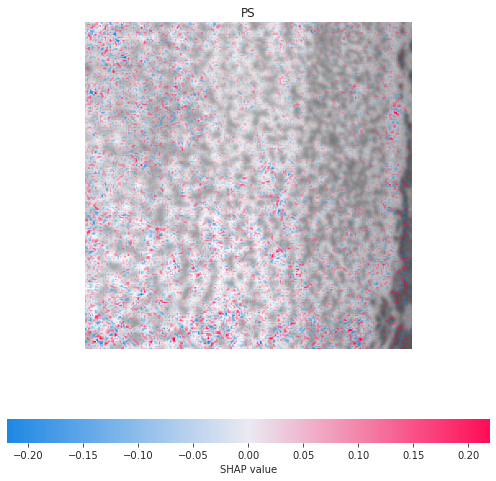

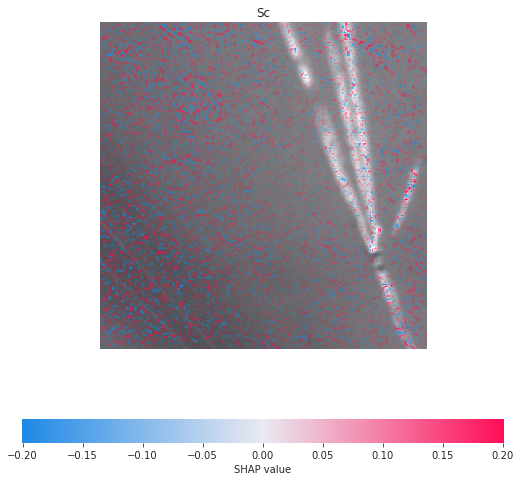

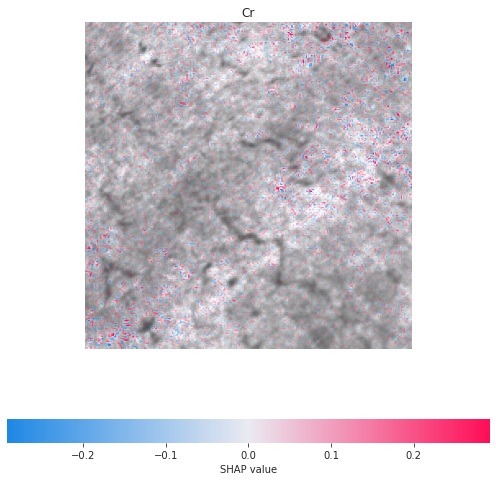

In [68]:
image_shap(learn, test_dls)

We then plot the SHAP values, one for each pixel as a mask on top of our image. Red values contribute strongly to a positive classification for a class, blue to a negative.

### Exercise 11
* Does the model interpret defects in the same way as you? What does it do?
* What happens to interpretability if we do not pretrain and just use Normalize instead of Normalize.from_stats ? This will normalize on the current dataset.
* Compare with bad models and differently augmented models. What's the difference?
* (optional) How does a model try to interpret the image if it was trained with a batch size that was too small. Feel free to compare with other models.
* (optional) Does shuffling the data make a difference?


### Solution

epoch,train_loss,valid_loss,time
0,2.184347,1.656256,00:40
1,1.893029,0.861511,00:27
2,1.810702,0.981773,00:26
3,1.664109,0.738672,00:33
4,1.709201,0.691667,00:29
5,1.465339,0.673750,00:26
6,1.493761,0.697038,00:27
7,1.330634,0.605873,00:31
8,1.355601,0.588965,00:34
9,1.497787,0.499163,00:29


epoch,train_loss,valid_loss,time
0,2.982288,2.057109,00:06
1,2.810031,1.650038,00:02
2,2.529920,1.145468,00:02
3,2.155947,0.797377,00:02
4,1.861883,0.613907,00:03
5,1.635936,0.531720,00:02
6,1.463559,0.492422,00:02
7,1.332225,0.464083,00:02
8,1.226201,0.446877,00:02
9,1.139099,0.442353,00:02


Path('models/resnet18_pretrained_bs512.pth')

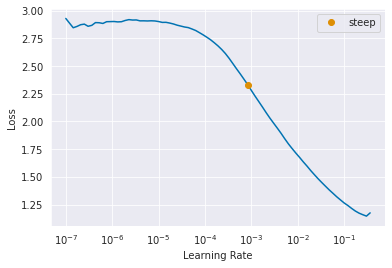

In [69]:
learn = vision_learner(dls, resnet18, pretrained=True)
learn.dls.train.bs=2
learn.fit_one_cycle(11, lr_max=1e-3)
learn.save('resnet18_pretrained_bs2')
learn = vision_learner(dls, resnet18, pretrained=True)
learn.dls.train.bs=512
lr = learn.lr_find(suggest_funcs=(steep))
learn.fit_one_cycle(11, lr_max=lr.steep)
learn.save('resnet18_pretrained_bs512')

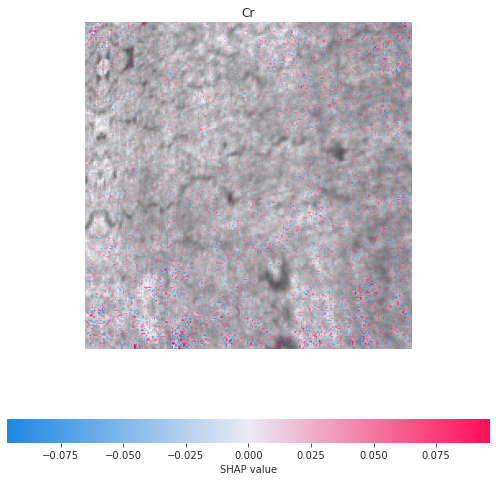

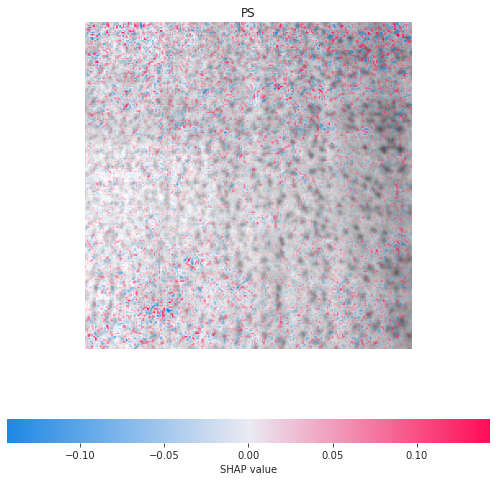

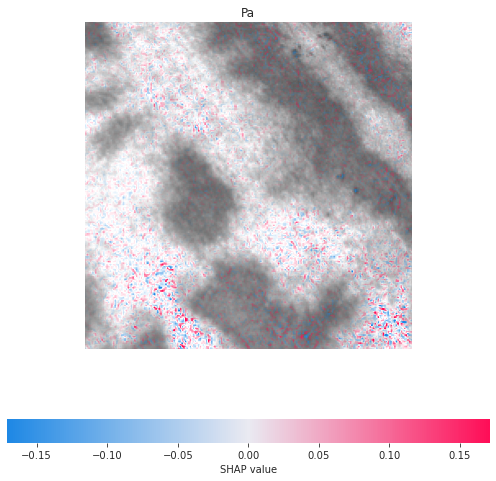

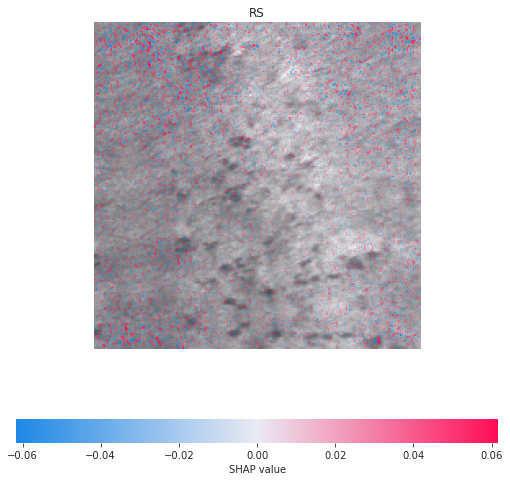

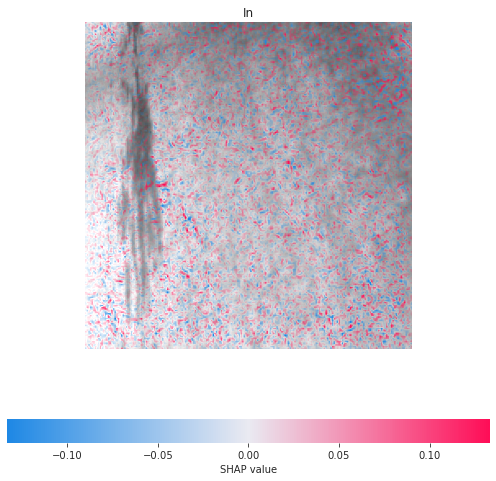

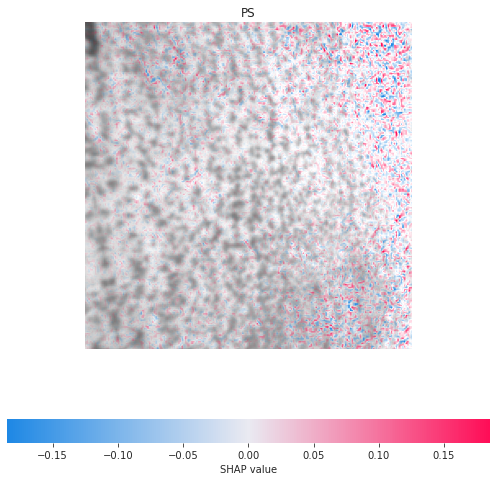

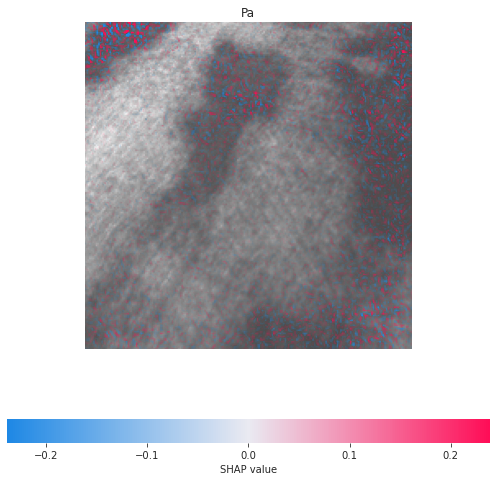

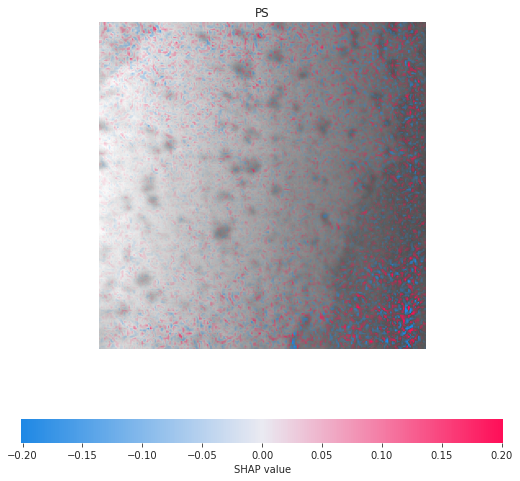

In [70]:
learn.load('resnet18_pretrained_bs2')
image_shap(learn, test_dls)

This model seems to interpret patches quite well but other images are often focused in the corners, is this useful or is it trying to cheat with overlap?

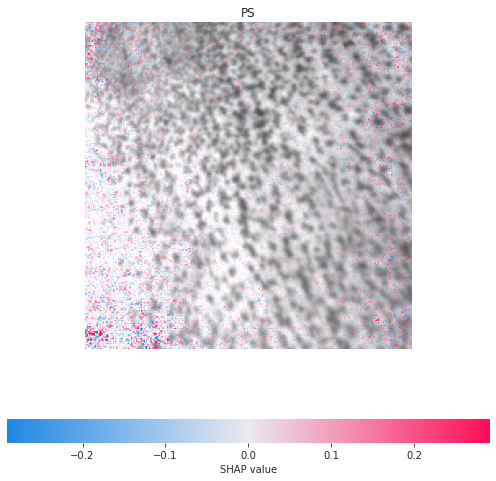

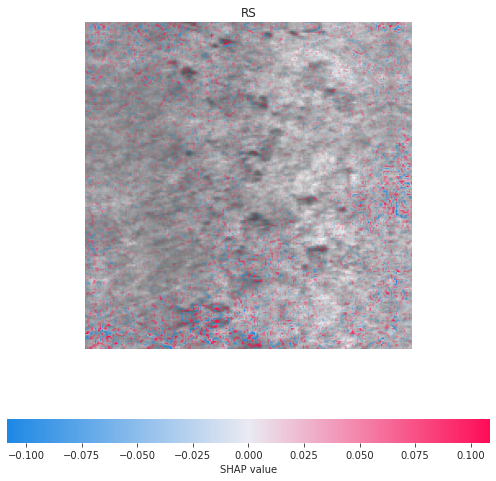

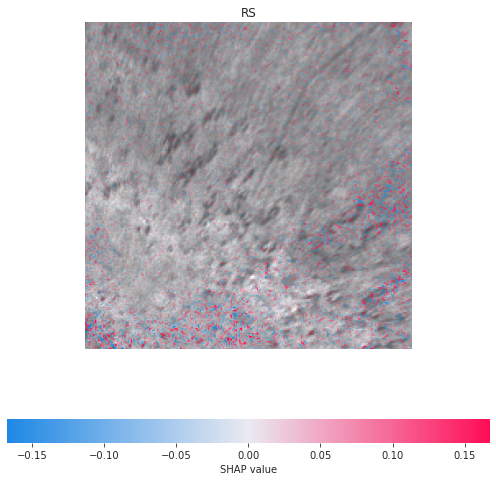

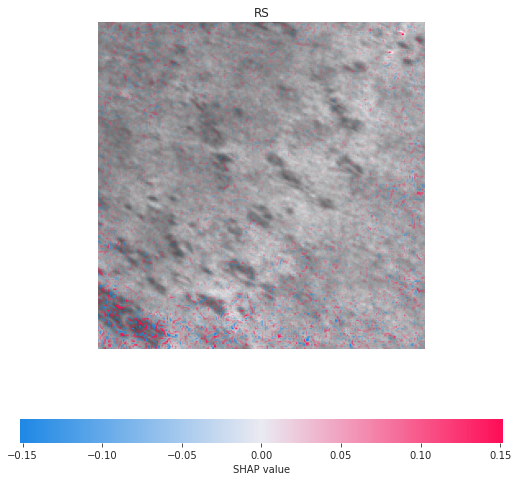

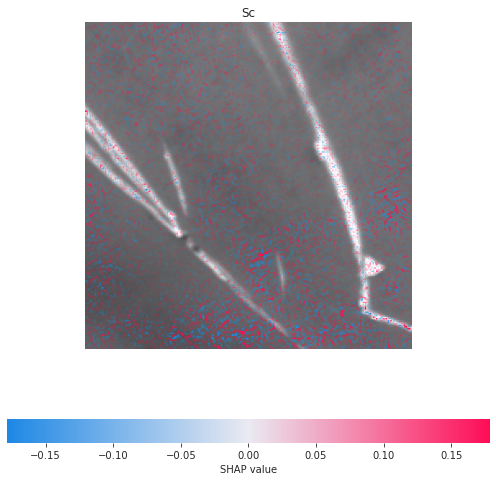

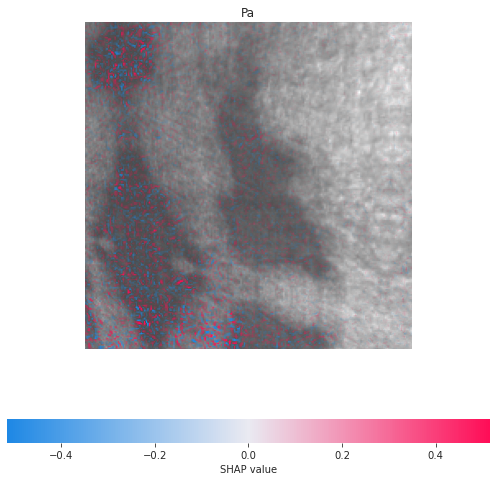

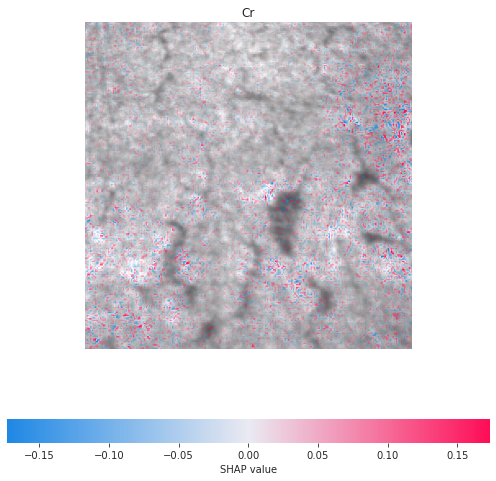

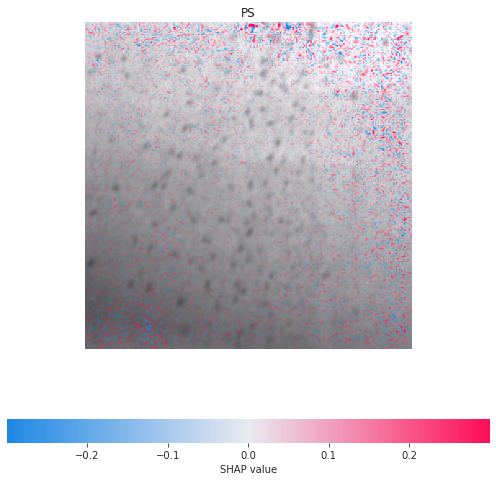

In [71]:
learn.load('resnet18_pretrained_bs512')
image_shap(learn, test_dls)

The batch size 512 model showed similar behavior, with it looking to the shape in between scratches, which is less intuitive to us but can still make sense.

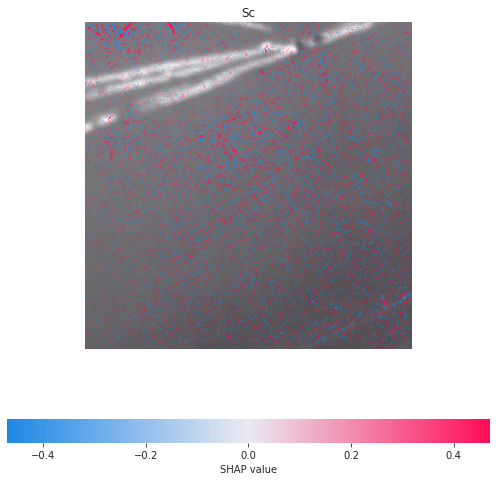

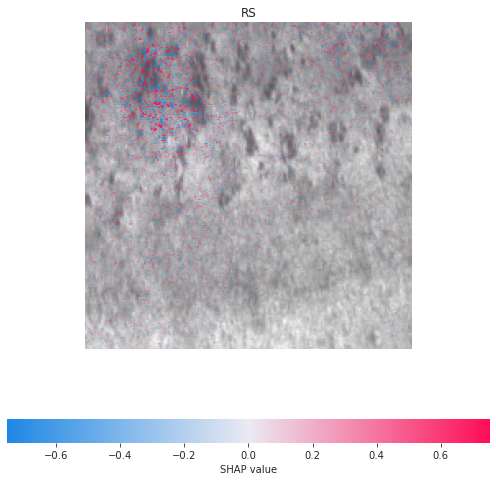

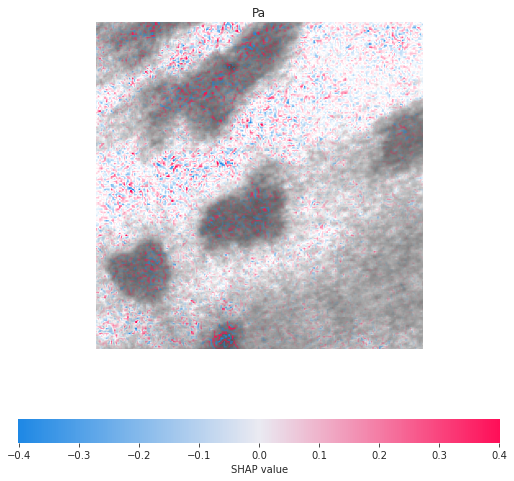

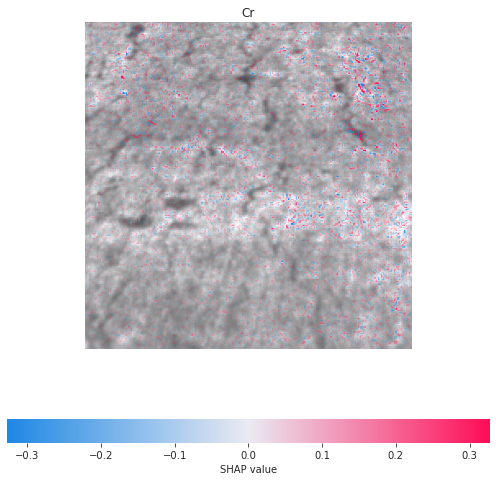

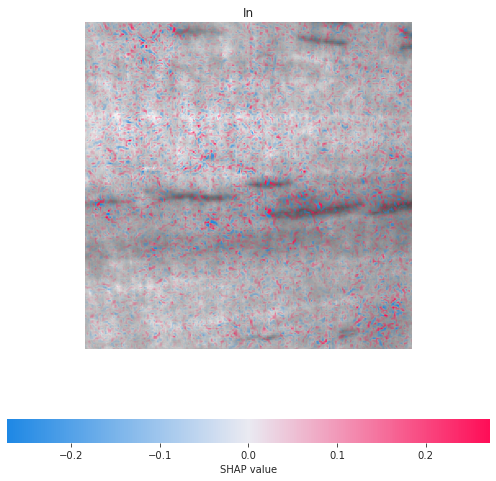

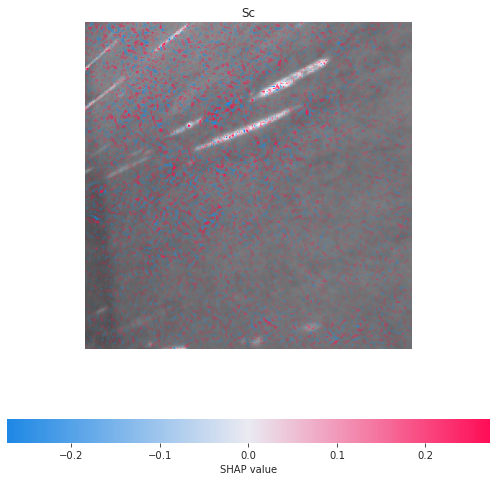

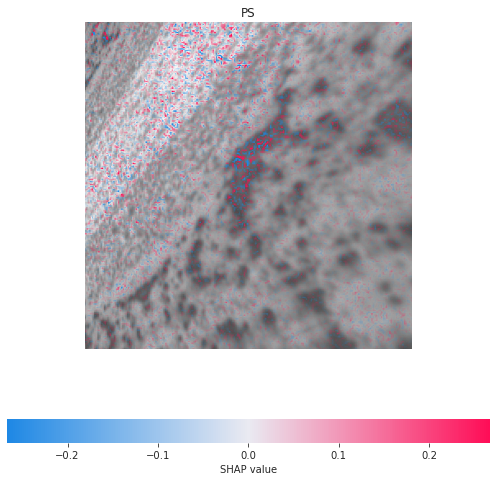

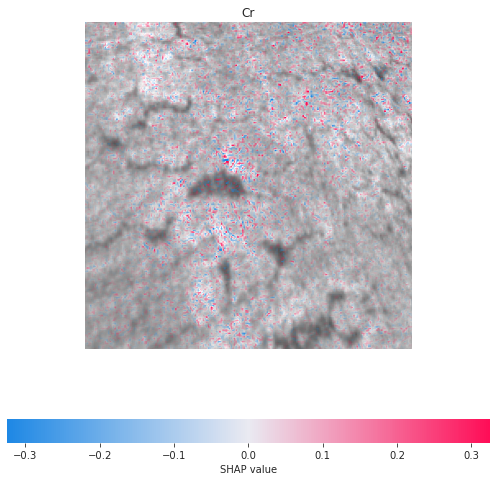

In [72]:
learn.load('resnet18_pretrained_bs64_aug')
image_shap(learn, test_dls)

Can we break it more by changing some settings? 

epoch,train_loss,valid_loss,time
0,2.568434,3.119234,00:26
1,2.407196,9.048854,00:24
2,2.061061,1.771790,00:25
3,2.238913,1.869579,00:25
4,1.978277,2.026071,00:24
5,1.925755,2.125725,00:25
6,1.942438,2.141757,00:24
7,1.813097,1.526683,00:25
8,1.904398,1.492037,00:24
9,1.787696,1.516542,00:24


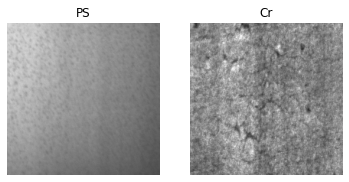

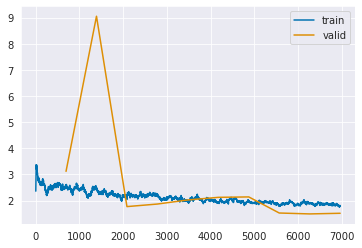

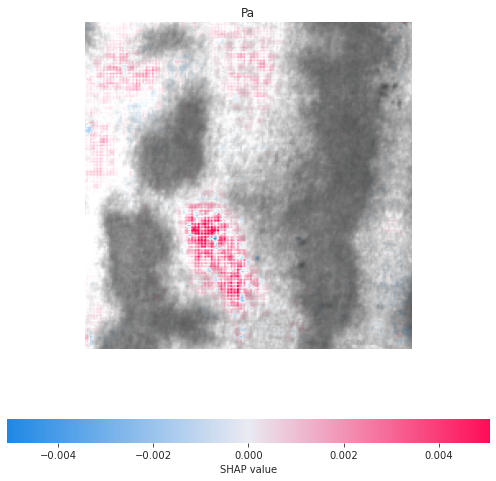

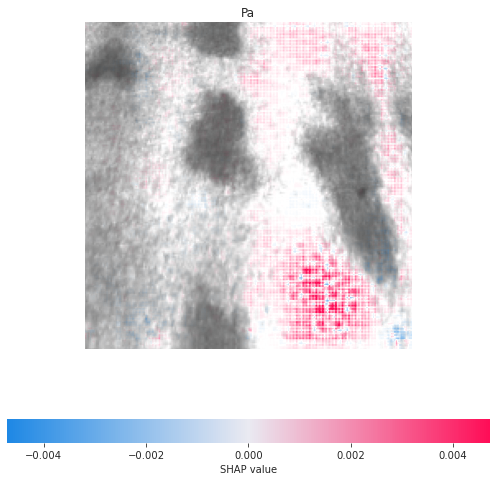

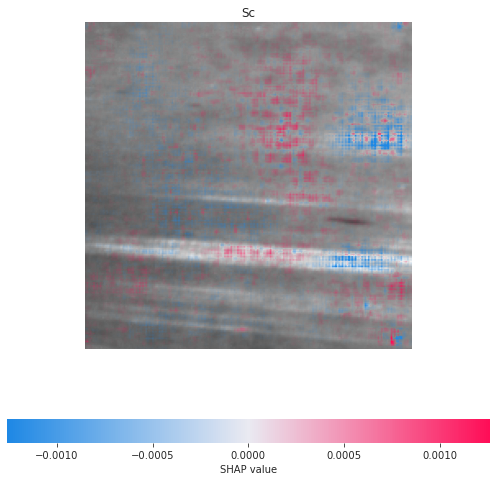

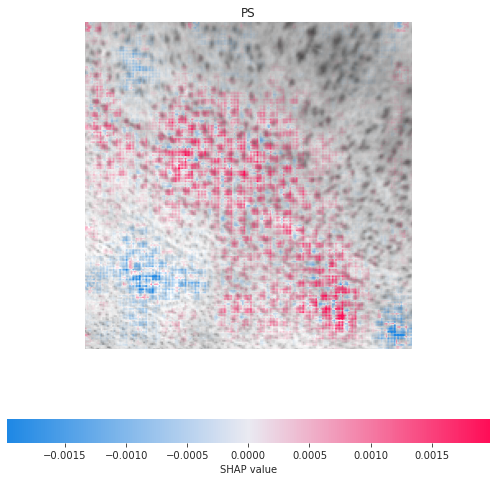

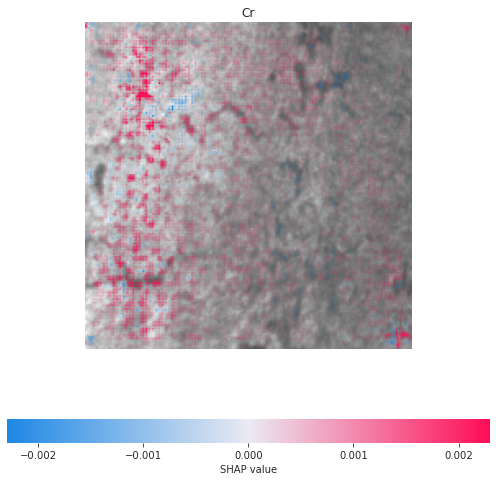

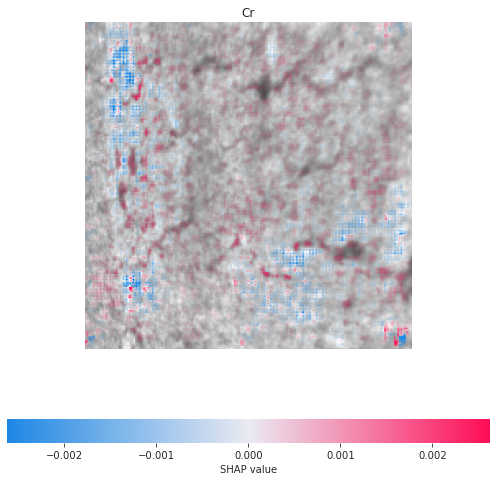

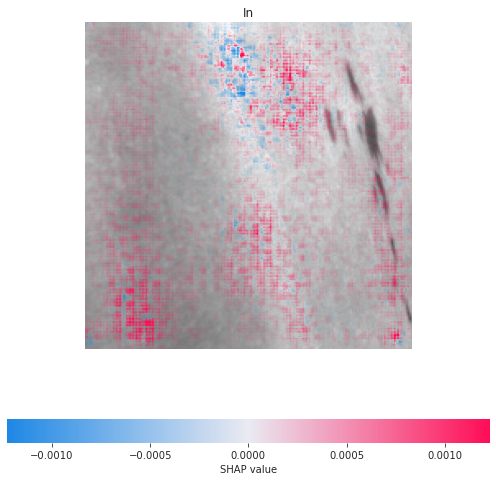

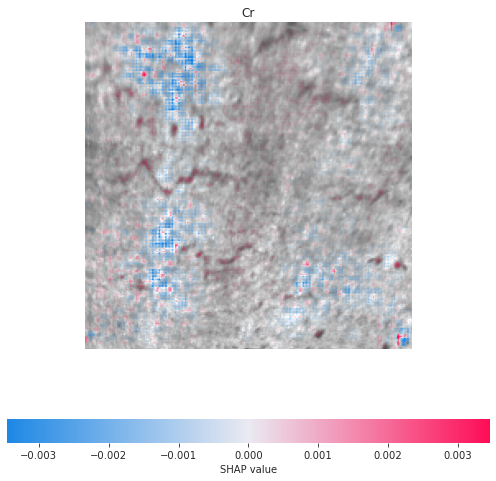

In [85]:
dls = ImageDataLoaders.from_name_func(path, files, get_label, bs=2, item_tfs=None, batch_tfms=None,shuffle=False) 
dls.show_batch()
learn = vision_learner(dls, resnet18, pretrained=False)
learn.dls.train.bs=2
learn.fit_one_cycle(10, lr_max=1e-3,wd=0)
plt.subplots(1,1)
learn.recorder.plot_loss()
image_shap(learn, test_dls)

It actually seems more interpretable now because we turned off pretraining! It now has less of a tendency to look for delocalized patterns. Is this because we have more focused filters in early layers? Or is it because we memorized the dataset? We would need extra training data to figure this out ideally, though we did just check an augmented test set rather than the training data. The problem all the images still derive from a highly limited set of plates with pictures taking in very specific conditions. Would disabling test augmentation change much?

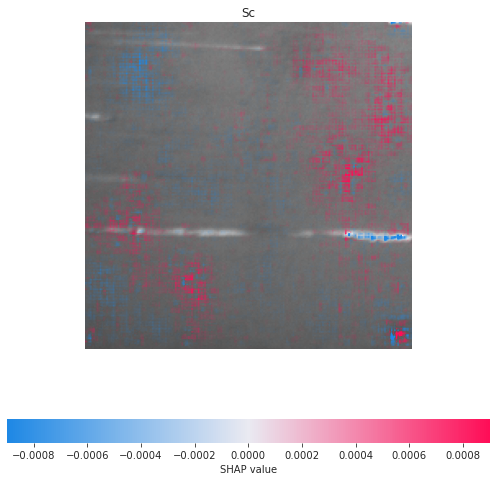

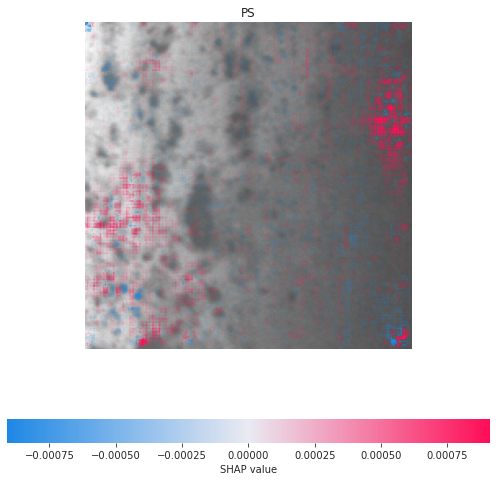

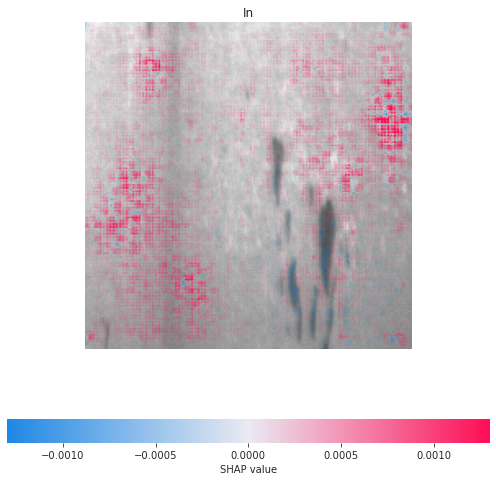

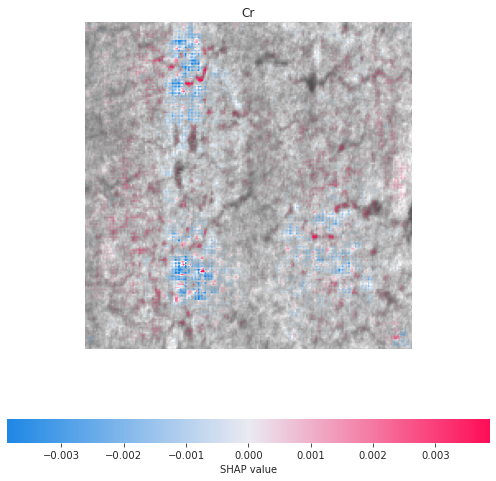

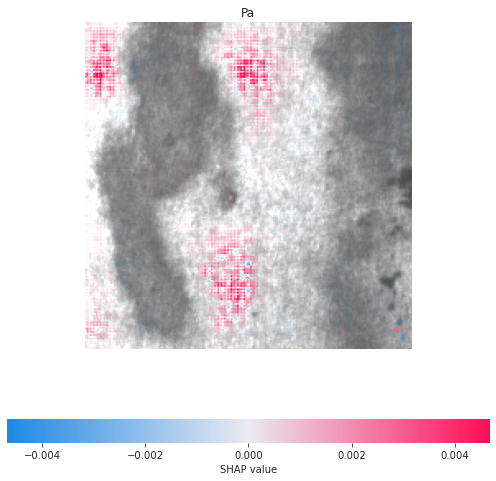

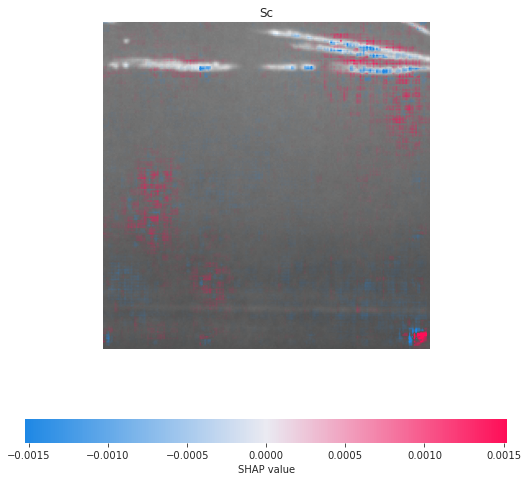

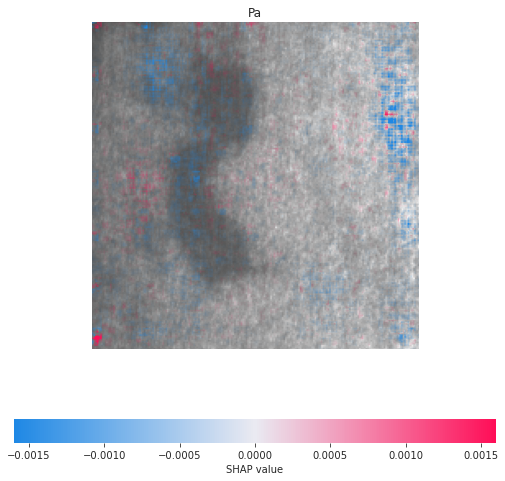

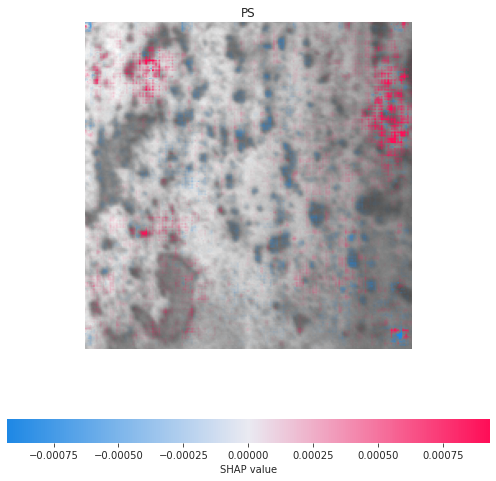

In [86]:
test_dls2 = ImageDataLoaders.from_name_func(path, test_files, get_label, bs=16, batch_tfms=[Normalize.from_stats(*imagenet_stats)], shuffle=True)

image_shap(learn, test_dls2)

Not really, it is interpreting the images in a much more human way now. What if we normalize with statistics from this dataset and train a quick new model?

epoch,train_loss,valid_loss,time
0,1.268982,5.802214,00:11
1,0.862587,2.030864,00:06
2,0.659669,0.270580,00:05


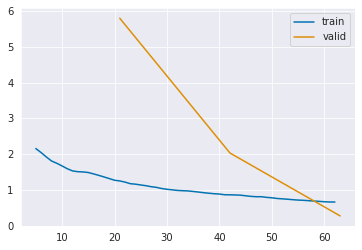

In [108]:
dls = ImageDataLoaders.from_name_func(path, files, get_label, bs=64, batch_tfms=[*aug_transforms(mult=1.0,
                do_flip=True,
                flip_vert=True,
                max_rotate=45.0,
                min_zoom=0.8,
                max_zoom=1.2,
                max_lighting=0.1,
                max_warp=0.3,
                p_affine=0.75,
                p_lighting=0.75,
                xtra_tfms=None,
                size=None,
                mode='bilinear',
                pad_mode='reflection',
                align_corners=True,
                batch=False,
                min_scale=1.0),Normalize]) 
learn = vision_learner(dls, resnet18, pretrained=False)
learn.dls.train.bs=64
learn.fit_one_cycle(3, lr_max=1e-3)
plt.subplots(1,1)
learn.recorder.plot_loss()


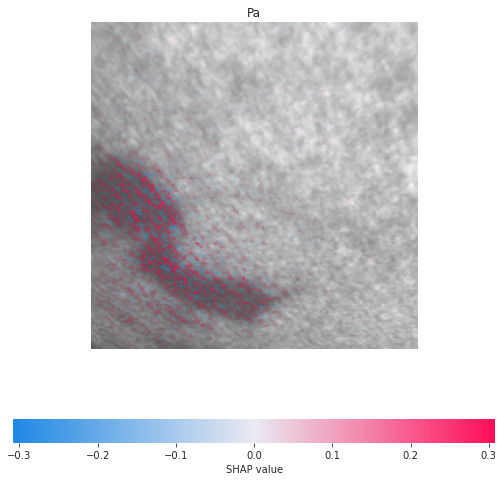

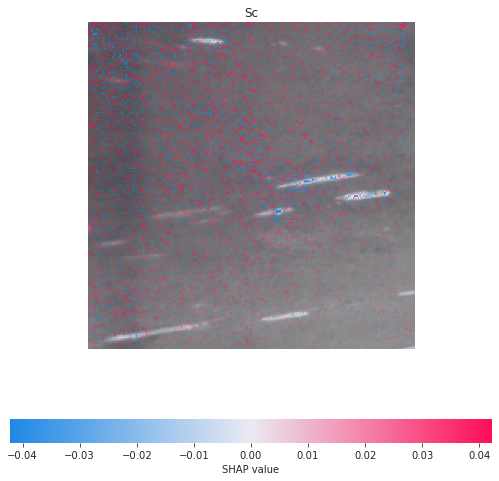

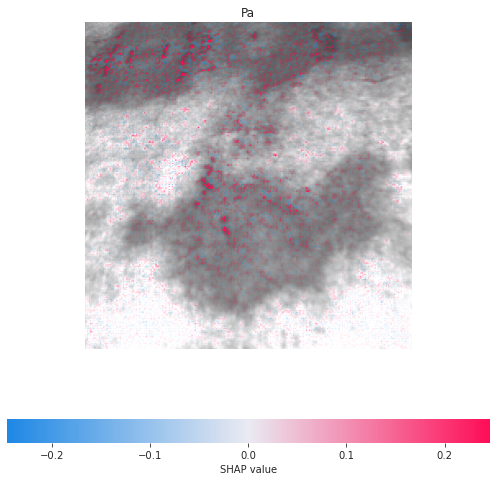

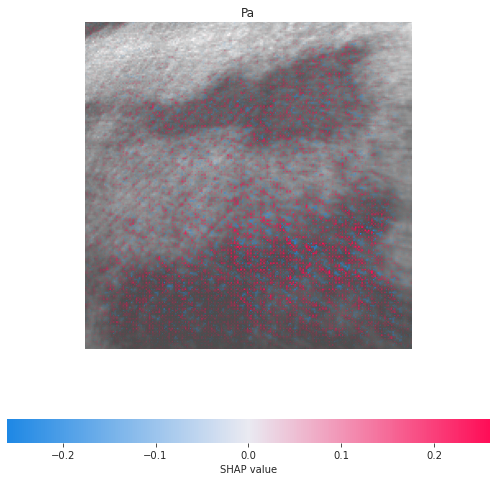

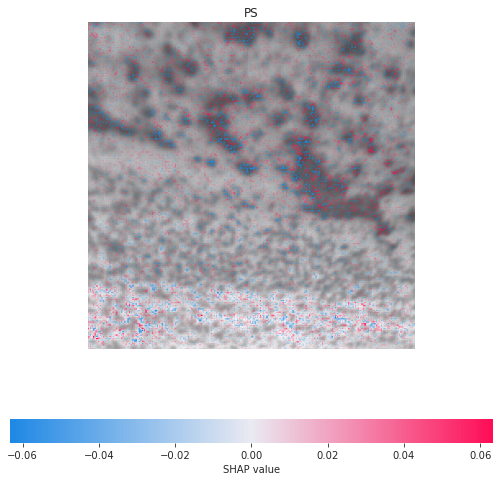

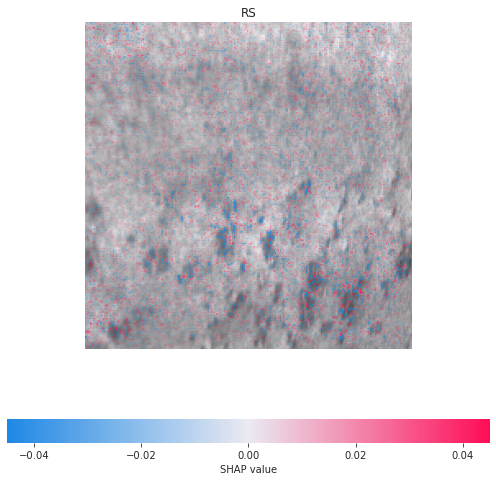

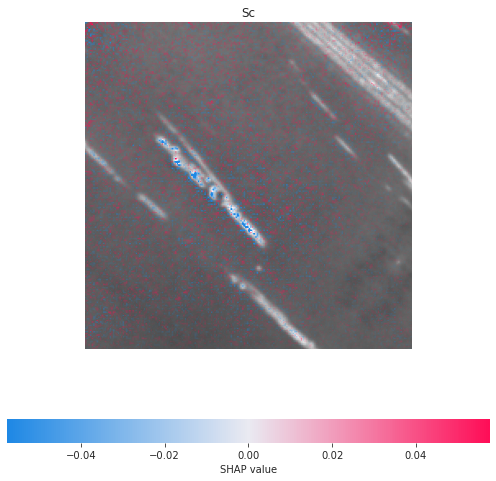

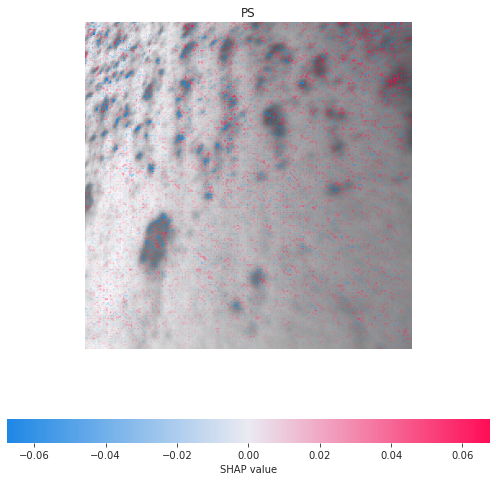

In [99]:
image_shap(learn, test_dls)

This is much more interpretable still. Choosing whether or not to use a pretrained model would then largely depend on performance on new data. Interpretability and performance sadly enough will not necessarily go hand in hand.